In [79]:
import timm
import torch
from MultiViT import MultiViT
import torchvision.transforms as transforms
import torchvision
from torch.nn import functional
import matplotlib.pyplot as plt
import time


def create_patch_list(total_patches, cut):
    # Calcola l'importo scontato per ogni blocco di 3 elementi
    discounted_patches = total_patches
    patch_list = []
    for i in range(12):
        if i % 3 == 0 and i != 0:
            discounted_patches = int(discounted_patches * (cut / 100))
        patch_list.append(discounted_patches)
    return patch_list

def create_mask(patch_list, mask_size, patch_size):
    mask = torch.zeros((mask_size, mask_size), dtype=torch.float32)
    for patch_index in patch_list:
        x = (patch_index // (mask_size // patch_size)) * patch_size
        y = (patch_index % (mask_size // patch_size)) * patch_size
        mask[x:x+patch_size, y:y+patch_size] = 1
    return mask


def seleziona_indici_iterativamente(lista_originale, indici_selezione):
    risultati = []
    lista_attuale = lista_originale[:]

    for selezione in indici_selezione:
        indici_selezionati = [lista_attuale[i] for i in selezione]
        risultati.append(indici_selezionati)

        lista_attuale = indici_selezionati[:]

    return risultati

In [87]:
model_weights_path = "../../Models/Imagenette_pretrained"
dataset_path = "../../Datasets/"

dim = 192
heads = 3
image_size = 224
patch_size = 16
depth = 12
mlp_dim = dim * 4

num_classes = 10

n_patch = create_patch_list(196, 50)

n_patch

[196, 196, 196, 98, 98, 98, 49, 49, 49, 24, 24, 24]

In [88]:
model_vit = MultiViT(
    image_size=image_size,
    patch_size=patch_size,
    num_classes=num_classes,
    dim=dim,
    depth=depth,
    heads=heads,
    mlp_dim=mlp_dim,
    n_patch = n_patch
)

In [89]:
checkpoint = torch.load(model_weights_path)

model_vit.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [90]:
mean = (0.5, 0.5, 0.5)
std = (0.5, 0.5, 0.5)

transform_train = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

transform_validation = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])


# Prepare dataset
set = torchvision.datasets.Imagenette(root=dataset_path, split='val', transform=transform_train) #download=True,
test_loader = torch.utils.data.DataLoader(set, batch_size=1, shuffle=True, num_workers=2, pin_memory=True)

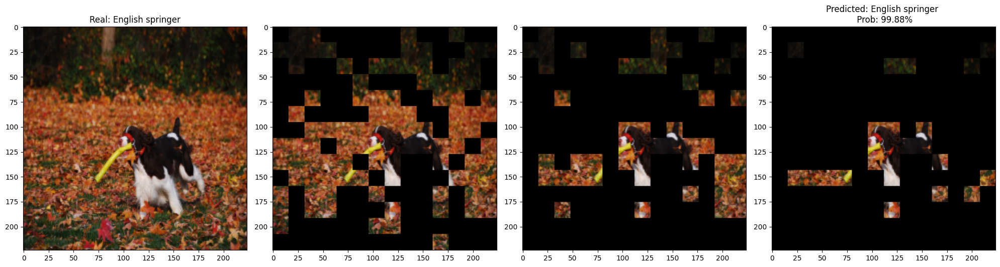

#############################


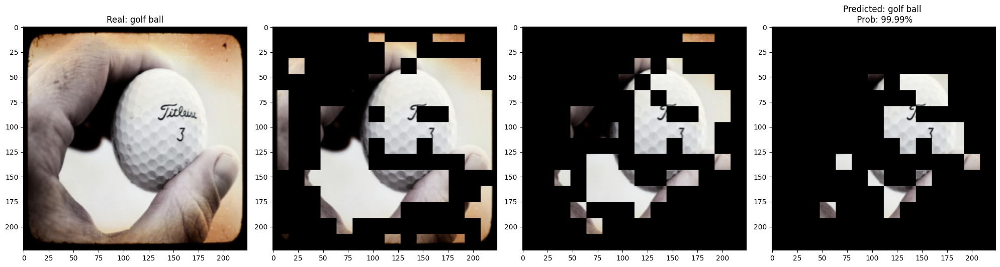

#############################


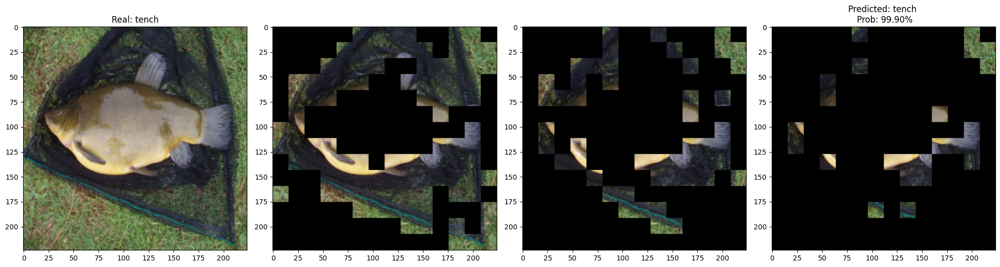

#############################


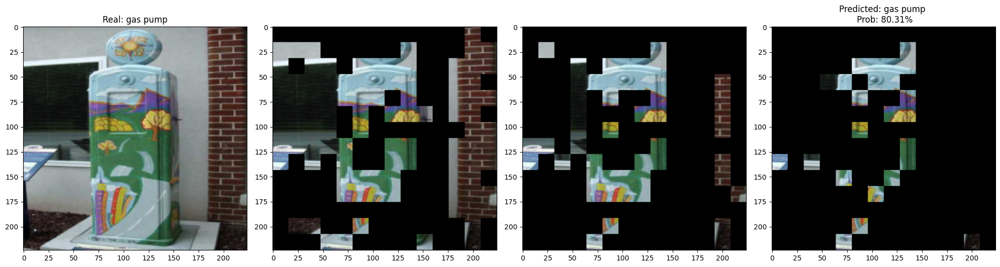

#############################


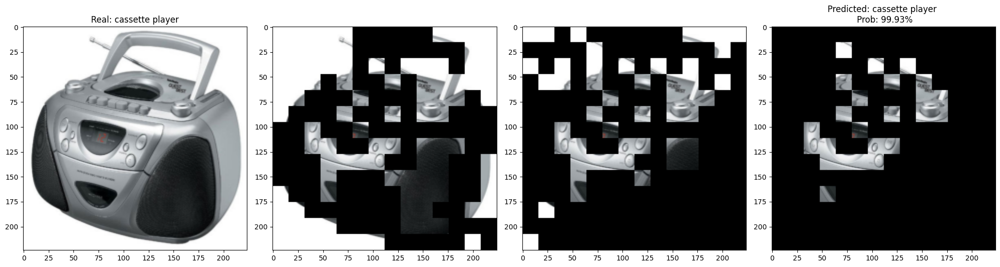

#############################


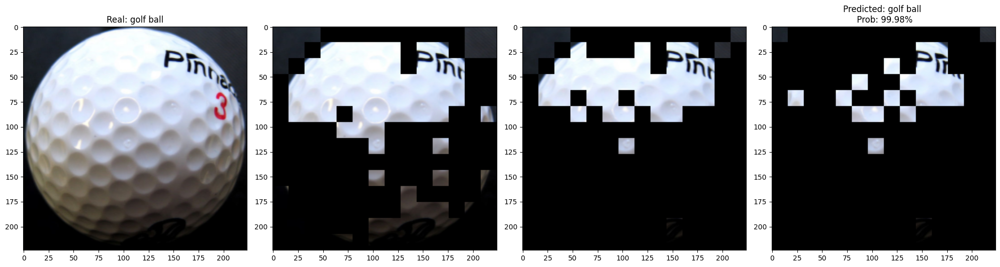

#############################


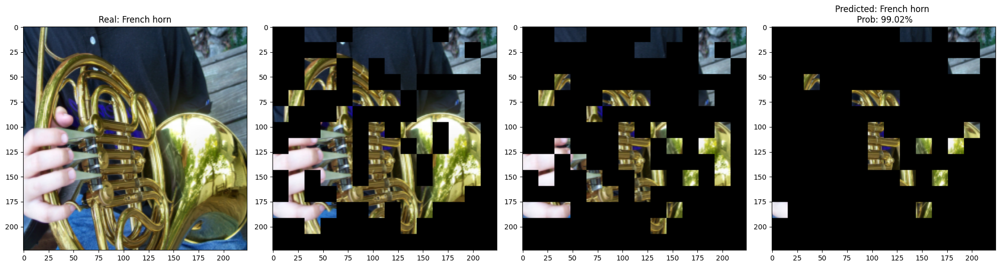

#############################


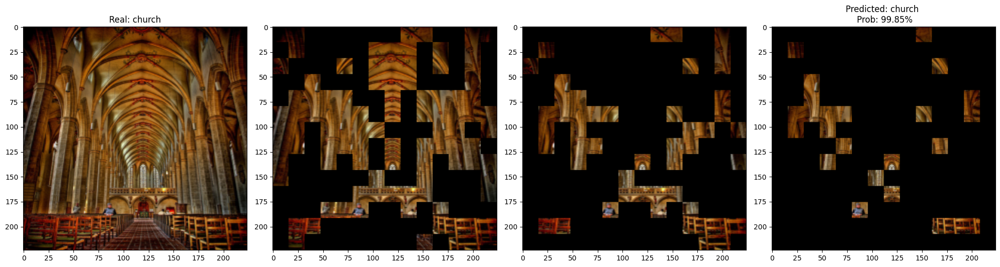

#############################


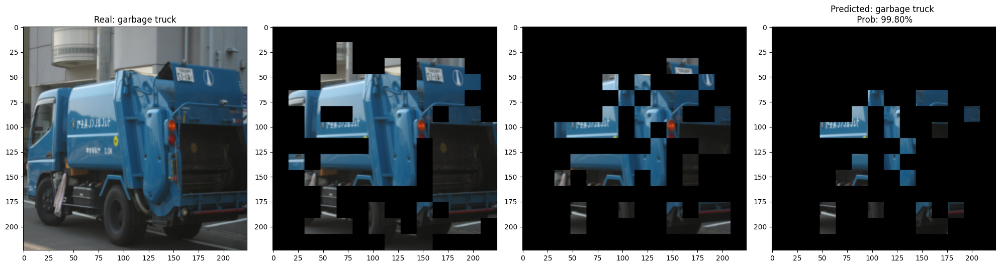

#############################


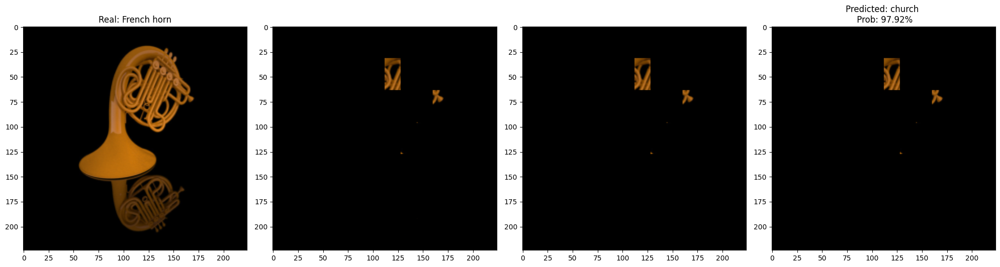

#############################


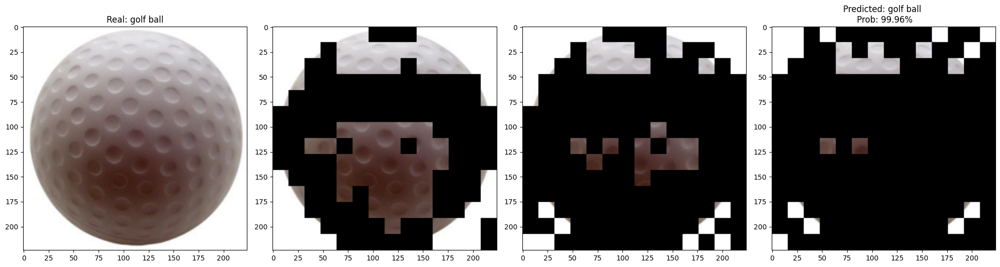

#############################


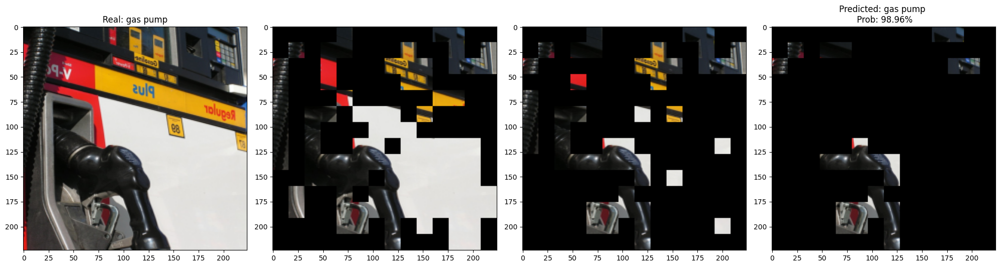

#############################


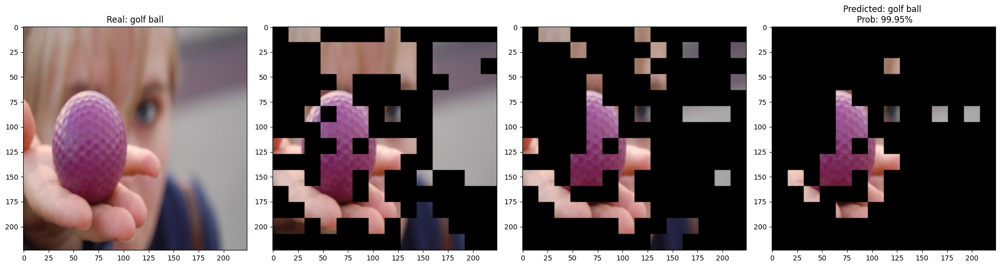

#############################


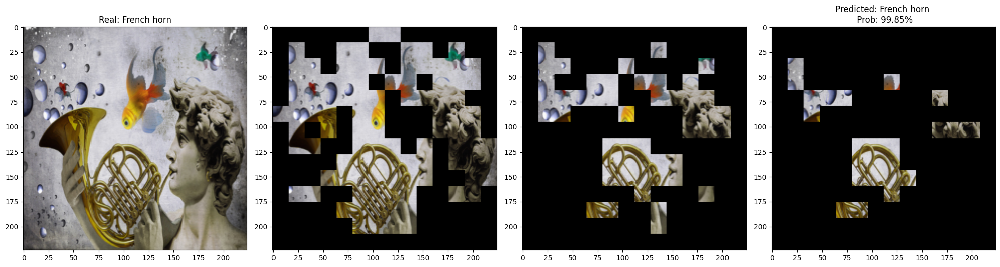

#############################


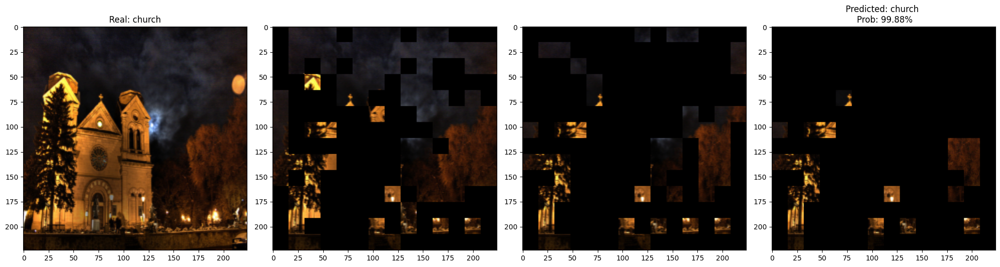

#############################


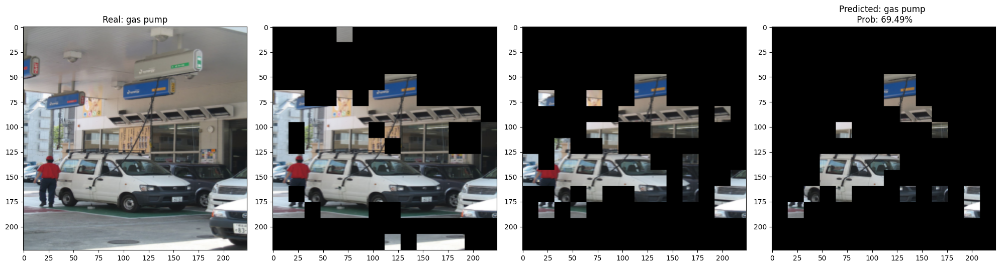

#############################


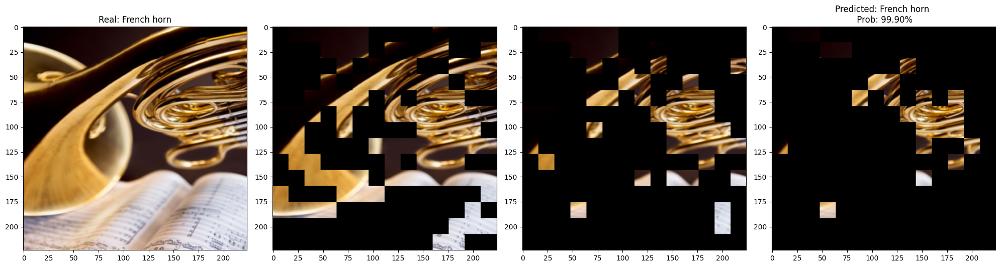

#############################


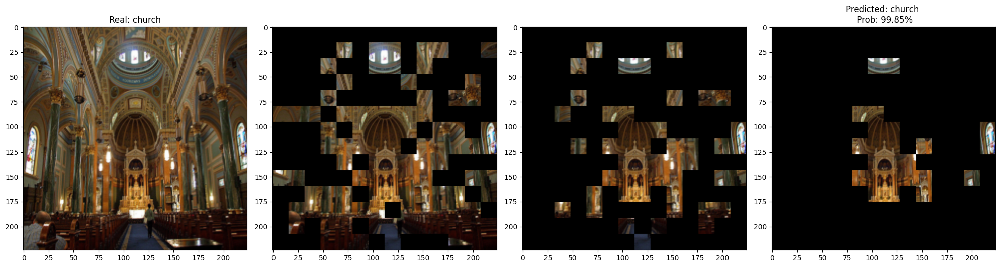

#############################


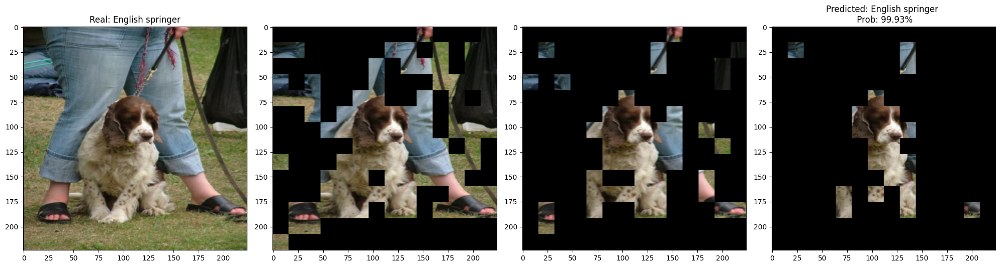

#############################


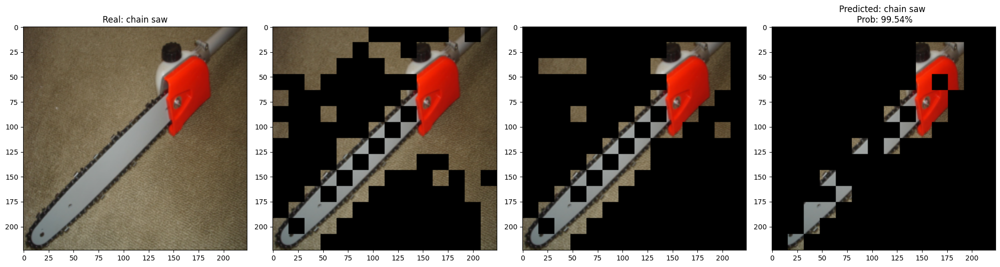

#############################


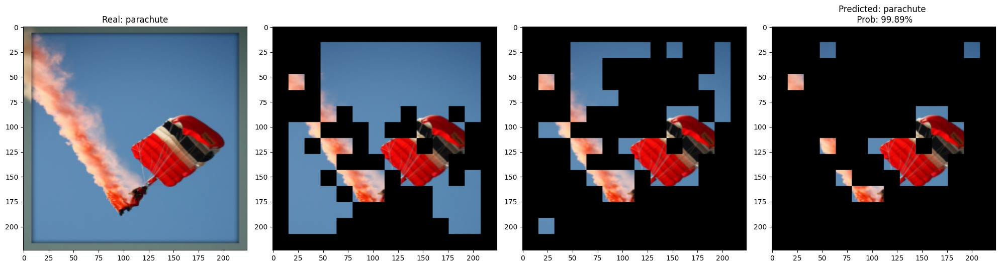

#############################


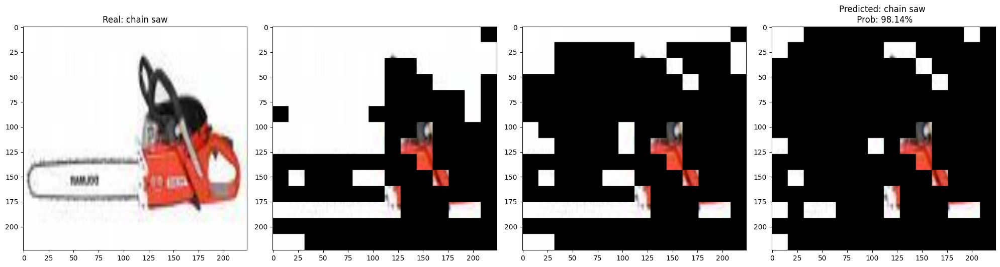

#############################


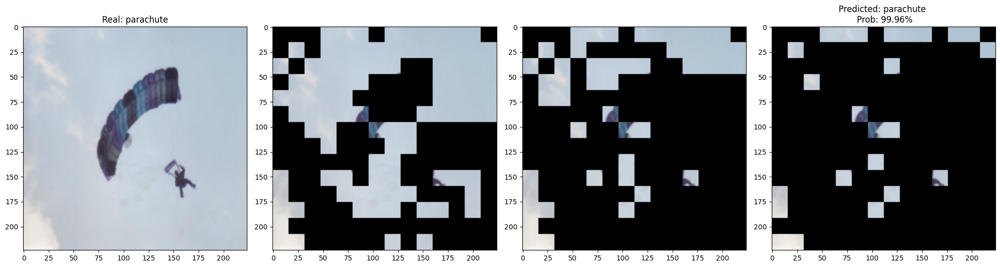

#############################


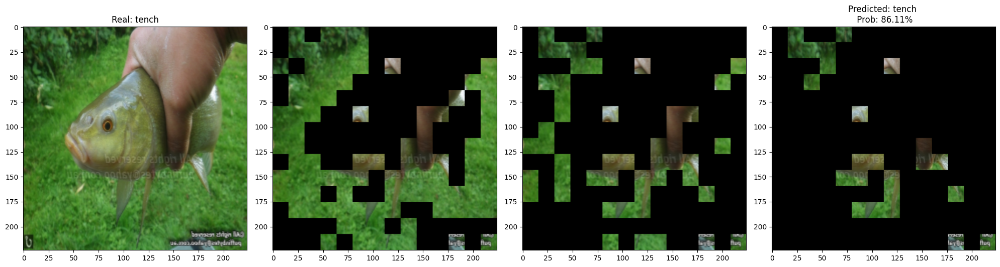

#############################


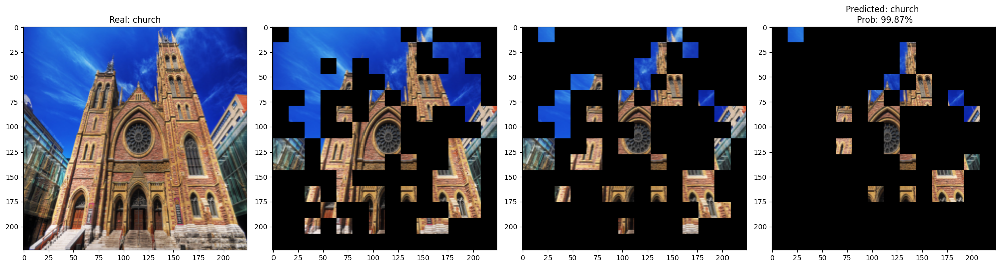

#############################


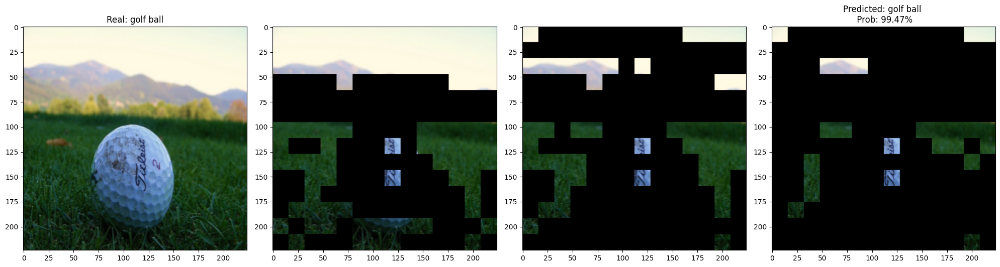

#############################


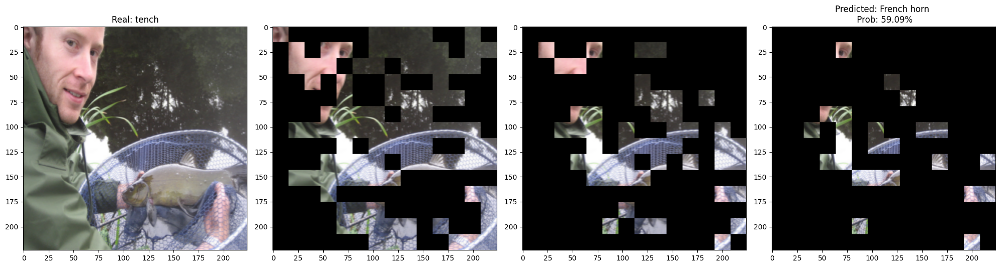

#############################


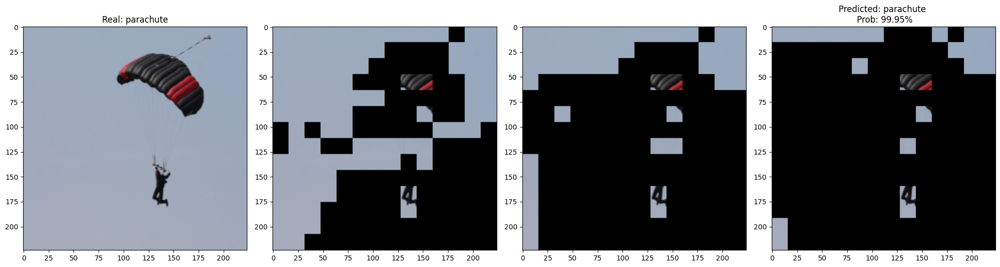

#############################


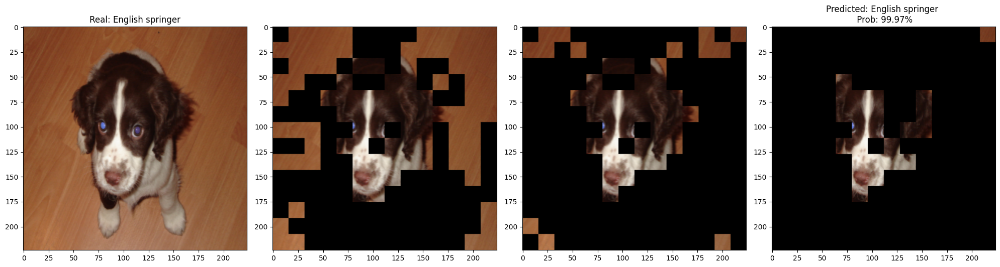

#############################


KeyboardInterrupt: 

In [91]:
mean = torch.tensor([0.5, 0.5, 0.5])
std = torch.tensor([0.5, 0.5, 0.5])

for i, (data, target) in enumerate(test_loader):

    results, tokens = model_vit(data, return_tokens = True)

    results = functional.softmax(results, dim=1)
    predicted_prob, predicted_idx = torch.max(results, dim=1)
    predicted_label = set.classes[predicted_idx[0]]
    real_label = set.classes[target[0]]

    total = [i for i in range(196)]

    final = [elem[0].tolist() for elem in tokens]

    indici = seleziona_indici_iterativamente(total, final)

    result = []
    for indice in indici:
        mask = create_mask(indice, data.shape[2], patch_size)
        data_modified = data[0] * std.unsqueeze(0).unsqueeze(2).unsqueeze(3) + mean.unsqueeze(0).unsqueeze(2).unsqueeze(3)
        result.append(data_modified[0] * mask.unsqueeze(0).unsqueeze(1))

    fig, axes = plt.subplots(1, 4, figsize=(20, 8))

    for j in range(0, 4):
        image = result[j*3][0].cpu()
        axes[j].imshow(image.permute(1, 2, 0), cmap=plt.cm.binary)
        if j == 0: axes[j].set_title(f'Real: {real_label[0]}')
        probability_percentage = predicted_prob.item() * 100
        formatted_prob = "{:.2f}%".format(probability_percentage)
        if j == 3: axes[j].set_title(f'Predicted: {predicted_label[0]} \n Prob: {formatted_prob}')

    plt.tight_layout()  # Assicura che le immagini siano ben posizionate
    plt.show()


    print("#############################")
    time.sleep(2)
